<a href="https://colab.research.google.com/github/Ngwijabagabo/Groundwater_Storage_pred/blob/main/Mugesera_LULC_CN_Modeling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Mugesera LULC Change Modeling: CA-Markov Simulation + Dynamic Curve Number (per Sub-Basin)

**Google Colab notebook.** Adapted from the CA-Markov / Markov-CA methodology, fixed for known bugs,
extended to run on Google Colab, and extended to:

1. Forecast LULC for **2030, 2040, 2050, 2080, 2090, 2100** (rolled forward decade-by-decade from the
   calibrated 2010->2020 transition; 2060/2070 are kept as intermediate steps but only the six requested
   years are reported/exported).
2. Calculate **Curve Number (CN) per sub-basin** using
   `projects/ee-ngwijabagabohyacinthe/assets/SUBBASINS`, in addition to the AOI-wide dynamic CN, and show
   **spatial CN maps per sub-basin with sub-basin ID labels**.
3. Export **GeoTIFFs of every LULC map** (actual, simulated, and all forecast years) at the end.
4. Use the **correct local spatial reference** for the basin and sub-basin layers (see Section 1b).
5. Render all static map panels with a **white background and a visible lat/lon grid**, and add a panel
   of the **predictor / driver variables** (distance to roads, lakes, parks, slope, DEM).

> **Cloud project:** `ee-ngwijabagabohyacinthe`
>
> Cells marked **ACTION REQUIRED** contain assumptions (class recoding, suitability weights, Curve
> Number lookup table, Kappa threshold, sub-basin ID field name) that are defensible defaults, not
> verified-for-Mugesera values. Review/edit them for your actual study before treating outputs as final.
>
> This notebook was assembled outside Colab (no Earth Engine credentials/network access in that
> environment), so treat it as a carefully fixed and extended **draft**: run it top-to-bottom in Colab and
> watch the first-run print statements (property names, grid shapes, unique values) - several ACTION
> REQUIRED cells depend on what those show for *your* assets.

## 0. Setup (Colab)

In [1]:
#@title Install dependencies
!pip -q install earthengine-api geemap rasterio scikit-learn scipy pyproj --upgrade

import ee, geemap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors
import matplotlib.patches as mpatches
from matplotlib.ticker import MaxNLocator
from scipy.ndimage import convolve
from sklearn.metrics import cohen_kappa_score, confusion_matrix, accuracy_score
import rasterio
from rasterio.transform import from_bounds
import pyproj
import os

CLOUD_PROJECT = 'ee-ngwijabagabohyacinthe'

try:
    ee.Initialize(project=CLOUD_PROJECT)
except Exception:
    ee.Authenticate()
    ee.Initialize(project=CLOUD_PROJECT)

print('Earth Engine initialized on project:', CLOUD_PROJECT)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.7/480.7 kB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.4/38.4 MB 50.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.1/9.1 MB 112.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.3/35.3 MB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 109.4 MB/s eta 0:00:00
Earth Engine initialized on project: ee-ngwijabagabohyacinthe


In [2]:
#@title (Optional) Mount Google Drive to persist outputs
# from google.colab import drive
# drive.mount('/content/drive')

## 1. Study Area & Parameters

In [3]:
aoi_fc = ee.FeatureCollection(
    'projects/ee-ngwijabagabohyacinthe/assets/MUGESERA_SHAPEFILE'
)
aoi_geom = aoi_fc.geometry()

SCALE = 30          # GLC-FCS30D native resolution (m)

# ---------------------------------------------------------------------------
# CORRECTED working CRS - see Section 1b for the full spatial-reference notes.
# The SUBBASINS shapefile's native projected CRS is UTM Zone 36S / WGS84
# (central meridian 33E, false northing 10,000,000, scale factor 0.9996),
# i.e. EPSG:32736 - Mugesera sits just east of the 30E zone-35/36 boundary.
# The notebook previously defaulted to EPSG:32735 (UTM 35S); that has been
# corrected here to EPSG:32736 so the working grid matches the sub-basin
# layer's own projection instead of an assumed neighboring zone.
# ---------------------------------------------------------------------------
CRS = 'EPSG:32736'  # UTM Zone 36S / WGS84 - matches SUBBASINS native CRS (see Sec. 1b)

BASE_YEAR_1 = 2000     # first calibration base year
BASE_YEAR_2 = 2010     # second calibration base year
VALIDATION_YEAR = 2020

# Requested reporting/export years
REPORT_YEARS = [2030, 2040, 2050, 2080, 2090, 2100]
# CA-Markov must roll forward one decade at a time, so we compute every decade
# between 2020 and 2100 and keep 2060/2070 as intermediate steps even though
# they are not in REPORT_YEARS.
ALL_STEP_YEARS = list(range(2030, 2101, 10))   # 2030 .. 2100

OUT_DIR = '/content/lulc_outputs'
os.makedirs(OUT_DIR, exist_ok=True)

Map = geemap.Map()
Map.centerObject(aoi_fc, 11)
Map.addLayer(aoi_fc.style(color='red', fillColor='00000000', width=2), {}, 'AOI')
Map

Map(center=[-2.080013980246785, 30.302913026222964], controls=(WidgetControl(options=['position', 'transparent…

## 1b. Spatial Reference Notes (Basin & Sub-basin source shapefiles)

The two source shapefiles were digitized/exported in **different local projected CRSs**, per their
`.prj` metadata:

| Layer | Source file | Projected CRS | Datum | Central meridian | False N/E | Scale factor |
|---|---|---|---|---|---|---|
| Basin (AOI) | `MUGESERA_Level_2.shp` | Arc 1960 Transverse Mercator (Rwanda national grid) | D_Arc_1960 (Clarke 1880 ellipsoid) | 30 E | 10,000,000 / 500,000 | 0.9999 |
| Sub-basins | `SubbasinsHECHNS.shp` | UTM Zone 36S, WGS84 | D_WGS_1984 | 33 E | 10,000,000 / 500,000 | 0.9996 |

**Why this matters / what was fixed:**

- Both shapefiles were already uploaded to Earth Engine as `aoi_fc` / `subbasins_fc`. EE stores
  `FeatureCollection` geometries as GeoJSON in **WGS84 lon/lat** internally regardless of the CRS the
  source shapefile carried at upload time, so `aoi_geom` and `subbasins_fc` are already
  co-registered in lon/lat - no reprojection of the *vector* assets is needed here.
- What **does** matter is the **working analysis CRS** (`CRS`, used by `to_array()`/`reproject()` and by
  the GeoTIFF export in Section 13). The notebook previously assumed `EPSG:32735` (UTM Zone 35S). The
  sub-basin shapefile's own metadata (`central_meridian = 33`, `false_northing = 10,000,000`,
  `scale_factor = 0.9996`) is a textbook match for **UTM Zone 36S / WGS84 = EPSG:32736**, not zone 35.
  `CRS` has been corrected to `'EPSG:32736'` in Section 1 above so raster sampling, area/distance
  calculations, and exported GeoTIFFs all sit in the sub-basin layer's native metric projection.
- The AOI shapefile's *original* projection (Arc 1960 TM, Rwanda national grid) is **not** a standard
  EPSG-registered UTM zone. It is reconstructable as the proj4 string below, in case you ever need to
  reproject the *original local .shp* (e.g. in QGIS/ArcGIS, before/without uploading to Earth Engine):

```
+proj=tmerc +lat_0=0 +lon_0=30 +k=0.9999 +x_0=500000 +y_0=10000000
+ellps=clrk80 +towgs84=-160,-6,-302,0,0,0,0 +units=m +no_defs
```

  (`towgs84` uses the standard regional Arc 1960 -> WGS84 shift; treat it as approximate - for
  survey-grade work confirm against Rwanda's official Arc 1960 -> WGS84 parameters rather than this
  generic regional shift.)

- The sub-basin shapefile's CRS translates directly to a clean EPSG code:

```
+proj=utm +zone=36 +south +datum=WGS84 +units=m +no_defs   # = EPSG:32736
```

The QA check below simply confirms the AOI and sub-basin geometries (as already ingested into Earth
Engine) actually overlap, which is the practical thing that would break if either asset had been
uploaded with a bad/omitted CRS.

In [4]:
# ACTION REQUIRED (sanity check, not a fix): confirm AOI and sub-basins overlap once ingested
# into Earth Engine. If this prints a near-zero intersection area, re-check how each shapefile was
# uploaded to EE (a missing/incorrect .prj at upload time is the usual cause of silent CRS drift).

subbasins_fc_qa = ee.FeatureCollection('projects/ee-ngwijabagabohyacinthe/assets/SUBBASINS')

aoi_area_km2 = aoi_geom.area(1).divide(1e6)
subbasins_union_area_km2 = subbasins_fc_qa.geometry().area(1).divide(1e6)
intersection_area_km2 = aoi_geom.intersection(subbasins_fc_qa.geometry(), 1).area(1).divide(1e6)

print('AOI area (km2):              ', aoi_area_km2.getInfo())
print('Sub-basins union area (km2): ', subbasins_union_area_km2.getInfo())
print('AOI ^ sub-basins area (km2): ', intersection_area_km2.getInfo())
print('-> If the intersection is near 0 while the two individual areas are not, the two assets')
print('   do not actually overlap in EE and the CRS/upload of one of them needs to be re-checked.')

# Reference proj4 strings (for reprojecting the ORIGINAL local .shp files outside of EE, if ever needed)
AOI_SOURCE_CRS_PROJ4 = (
    '+proj=tmerc +lat_0=0 +lon_0=30 +k=0.9999 +x_0=500000 +y_0=10000000 '
    '+ellps=clrk80 +towgs84=-160,-6,-302,0,0,0,0 +units=m +no_defs'
)
SUBBASIN_SOURCE_CRS_EPSG = 'EPSG:32736'  # UTM Zone 36S / WGS84

print('\nAOI source CRS (proj4):', AOI_SOURCE_CRS_PROJ4)
print('Sub-basin source CRS:  ', SUBBASIN_SOURCE_CRS_EPSG, '=', pyproj.CRS.from_epsg(32736).name)
print('Working analysis CRS (this notebook):', CRS)

AOI area (km2):               1863.2284153551498
Sub-basins union area (km2):  1890.0676724962696
AOI ^ sub-basins area (km2):  1855.422397368094
-> If the intersection is near 0 while the two individual areas are not, the two assets
   do not actually overlap in EE and the CRS/upload of one of them needs to be re-checked.

AOI source CRS (proj4): +proj=tmerc +lat_0=0 +lon_0=30 +k=0.9999 +x_0=500000 +y_0=10000000 +ellps=clrk80 +towgs84=-160,-6,-302,0,0,0,0 +units=m +no_defs
Sub-basin source CRS:   EPSG:32736 = WGS 84 / UTM zone 36S
Working analysis CRS (this notebook): EPSG:32736


## 2. Load GLC-FCS30D LULC (2000 / 2010 / 2020)

Annual band index: `year = 1999 + i`, band = `b{i}` (2000 -> b1, 2010 -> b11, 2020 -> b21).

In [5]:
annual = ee.ImageCollection("projects/sat-io/open-datasets/GLC-FCS30D/annual")
annual_img = annual.mosaic()

def band_for_year(year):
    i = year - 1999
    return 'b' + str(i)

# ---------------------------------------------------------------------------
# ACTION REQUIRED: class recoding scheme
# Original GLC-FCS30D codes -> 10 simplified thematic classes used for the
# Markov/CA model AND as the basis for the Curve Number lookup below.
# Edit groupings if your study needs finer LULC detail.
# ---------------------------------------------------------------------------
CLASS_MAP = {
    0: 0,                                      # No data
    10: 1, 11: 1, 12: 1, 20: 1,                 # Cropland
    51: 2, 52: 2, 61: 2, 62: 2, 71: 2, 72: 2,   # Forest
    81: 2, 82: 2, 91: 2, 92: 2,
    120: 3, 121: 3, 122: 3,                     # Shrubland
    130: 4,                                     # Grassland
    140: 5, 150: 5, 152: 5, 153: 5,             # Sparse vegetation
    181: 6, 182: 6, 183: 6, 184: 6, 185: 6,     # Wetland
    186: 6, 187: 6,
    190: 7,                                     # Built-up
    200: 8, 201: 8, 202: 8,                     # Bareland
    210: 9,                                     # Water
    220: 0,                                     # Snow/ice -> no-data (absent in Rwanda)
}
CLASS_NAMES = {
    0: 'No data', 1: 'Cropland', 2: 'Forest', 3: 'Shrubland', 4: 'Grassland',
    5: 'Sparse vegetation', 6: 'Wetland', 7: 'Built-up', 8: 'Bareland', 9: 'Water'
}
CLASS_IDS = [c for c in CLASS_NAMES if c != 0]   # classes actually modeled (1-9)

_from = list(CLASS_MAP.keys())
_to = list(CLASS_MAP.values())

def recode(img):
    return img.remap(_from, _to).rename('lulc')

lulc_2000 = recode(annual_img.select(band_for_year(BASE_YEAR_1))).clip(aoi_geom)
lulc_2010 = recode(annual_img.select(band_for_year(BASE_YEAR_2))).clip(aoi_geom)
lulc_2020 = recode(annual_img.select(band_for_year(VALIDATION_YEAR))).clip(aoi_geom)

palette = ['#808080', '#ffd37f', '#1a9850', '#a0b432', '#91cf60',
           '#c2b280', '#00a884', '#d73027', '#dcdcdc', '#4575b4']
vis = {'min': 0, 'max': 9, 'palette': palette}

Map.addLayer(lulc_2000, vis, 'LULC 2000')
Map.addLayer(lulc_2010, vis, 'LULC 2010')
Map.addLayer(lulc_2020, vis, 'LULC 2020 (actual)')
Map

Map(bottom=265474.0, center=[-2.080013980246785, 30.302913026222964], controls=(WidgetControl(options=['positi…

## 3. Driver (Suitability) Layers - visualized BEFORE prediction

In [6]:
tradeCenters = ee.FeatureCollection('projects/ee-ngwijabagabohyacinthe/assets/Trade_Centers')
roads        = ee.FeatureCollection('projects/ee-ngwijabagabohyacinthe/assets/Roads')
parks        = ee.FeatureCollection('projects/ee-ngwijabagabohyacinthe/assets/Parks_RW')
lakes        = ee.FeatureCollection('projects/ee-ngwijabagabohyacinthe/assets/Lakes_RW')

SEARCH_RADIUS = 50000  # meters; increase if AOI is far from some features
MAX_ERROR = 30          # meters; matches SCALE, avoids the "unbounded distance" error

dist_trade = tradeCenters.distance(SEARCH_RADIUS, MAX_ERROR).rename('dist_trade').clip(aoi_geom)
dist_roads = roads.distance(SEARCH_RADIUS, MAX_ERROR).rename('dist_roads').clip(aoi_geom)
dist_parks = parks.distance(SEARCH_RADIUS, MAX_ERROR).rename('dist_parks').clip(aoi_geom)
dist_lakes = lakes.distance(SEARCH_RADIUS, MAX_ERROR).rename('dist_lakes').clip(aoi_geom)

dem = ee.Image('USGS/SRTMGL1_003').clip(aoi_geom).rename('dem')
slope = ee.Terrain.slope(dem).rename('slope')

driver_vis_dist = {'min': 0, 'max': 5000, 'palette': ['blue', 'yellow', 'red']}
Map.addLayer(dist_trade, driver_vis_dist, 'Distance to Trade Centers')
Map.addLayer(dist_roads, driver_vis_dist, 'Distance to Roads')
Map.addLayer(dist_parks, driver_vis_dist, 'Distance to Parks')
Map.addLayer(dist_lakes, driver_vis_dist, 'Distance to Lakes')
Map.addLayer(dem, {'min': 900, 'max': 2200, 'palette': ['blue', 'green', 'yellow', 'brown', 'white']}, 'DEM')
Map.addLayer(slope, {'min': 0, 'max': 30, 'palette': ['white', 'orange', 'red']}, 'Slope')
Map

Map(bottom=265474.0, center=[-2.080013980246785, 30.302913026222964], controls=(WidgetControl(options=['positi…

## 4. Pull LULC + Drivers + Sub-Basins + Soil (HSG) to NumPy arrays (aligned grid)

`geemap.ee_to_numpy` samples every image on the **same pixel grid** (same region + scale), so all
arrays below are co-registered, in the corrected working `CRS` from Section 1/1b. For a large AOI this
can hit Earth Engine's per-request pixel limit - if you get a `pixel count exceeds` / `too many pixels`
error, increase `SCALE` or tile the AOI and mosaic the resulting arrays.

In [7]:
region = aoi_geom.bounds(1, 'EPSG:4326')

def to_array(img, band):
    # Reproject to the target CRS/scale first, then sample. Passing region only
    # (no crs/scale) to ee_to_numpy avoids double-resampling.
    reprojected_img = img.reproject(crs=CRS, scale=SCALE)
    try:
        arr = geemap.ee_to_numpy(reprojected_img.select(band), region=region)
    except Exception as e:
        raise RuntimeError(
            f"ee_to_numpy failed for band '{band}'. If this is a pixel-limit error, "
            f"increase SCALE or tile the AOI. Original error: {e}"
        )
    return arr[:, :, 0]

lulc2000_arr = to_array(lulc_2000, 'lulc')
lulc2010_arr = to_array(lulc_2010, 'lulc')
lulc2020_arr = to_array(lulc_2020, 'lulc')

dist_trade_arr = to_array(dist_trade, 'dist_trade')
dist_roads_arr = to_array(dist_roads, 'dist_roads')
dist_parks_arr = to_array(dist_parks, 'dist_parks')
dist_lakes_arr = to_array(dist_lakes, 'dist_lakes')
dem_arr = to_array(dem, 'dem')
slope_arr = to_array(slope, 'slope')

print('Grid shape:', lulc2000_arr.shape)

def norm01(a):
    a = a.astype(float)
    lo, hi = np.nanpercentile(a, 2), np.nanpercentile(a, 98)
    return np.clip((a - lo) / (hi - lo + 1e-9), 0, 1)

drivers_norm = {
    'dist_trade': norm01(dist_trade_arr),
    'dist_roads': norm01(dist_roads_arr),
    'dist_parks': norm01(dist_parks_arr),
    'dist_lakes': norm01(dist_lakes_arr),
    'dem': norm01(dem_arr),
    'slope': norm01(slope_arr),
}

Grid shape: (1815, 2019)


### 4a. Sub-basins -> numeric ID raster

The `SUBBASINS` asset identifies each sub-basin with a **string** field named `name` (values like
`Subbasin-1`, `Subbasin-2`, ...), not a numeric field - so it can't be fed to `reduceToImage` directly
(that silently produces an empty/NaN raster, which is what caused the `KeyError: 'subbasin_id'`
downstream in Section 12: zero valid pixels -> zero zonal-stats records -> an empty DataFrame with no
`subbasin_id` column to sort by).

This cell parses the trailing number out of `name` (`"Subbasin-2"` -> `2`) to build a numeric ID,
attaches it as `SB_ID`, and rasterizes that instead, **on the corrected working `CRS`**. **ACTION
REQUIRED**: re-run the print statement below and confirm `name` still holds after any asset re-export;
adjust `SUBBASIN_ID_FIELD` if it doesn't.

In [8]:
import re

subbasins_fc = ee.FeatureCollection('projects/ee-ngwijabagabohyacinthe/assets/SUBBASINS')

print('Properties of a sample sub-basin feature:')
print(subbasins_fc.first().propertyNames().getInfo())
print(subbasins_fc.first().getInfo()['properties'])
print('Number of sub-basins:', subbasins_fc.size().getInfo())

# ACTION REQUIRED: confirmed field for the SUBBASINS asset - a STRING like "Subbasin-1", "Subbasin-2", ...
SUBBASIN_ID_FIELD = 'name'

ids_str = subbasins_fc.aggregate_array(SUBBASIN_ID_FIELD).distinct().sort().getInfo()
print('Sub-basin name values found:', ids_str)

def _parse_subbasin_number(s):
    m = re.search(r'(\d+)', str(s))
    return int(m.group(1)) if m else None

# Prefer the trailing number in the name (Subbasin-2 -> 2); fall back to a fresh
# incrementing ID for any name that has no embedded number.
id_to_idx = {s: _parse_subbasin_number(s) for s in ids_str}
next_free = max([v for v in id_to_idx.values() if v is not None], default=0) + 1
for s in ids_str:
    if id_to_idx[s] is None:
        id_to_idx[s] = next_free
        next_free += 1
print('name -> numeric SB_ID mapping:', id_to_idx)

id_to_idx_ee = ee.Dictionary(id_to_idx)

def _add_numeric_id(f):
    return f.set('SB_ID', id_to_idx_ee.get(ee.String(f.get(SUBBASIN_ID_FIELD))))

subbasins_numeric = subbasins_fc.filter(ee.Filter.notNull([SUBBASIN_ID_FIELD])).map(_add_numeric_id)

subbasin_img = subbasins_numeric.reduceToImage(
    properties=['SB_ID'],
    reducer=ee.Reducer.first()
).rename('SB_ID').clip(aoi_geom)

Map.addLayer(subbasin_img.randomVisualizer(), {}, 'Sub-basins (random colors)')
Map.addLayer(subbasins_fc.style(color='black', fillColor='00000000', width=1), {}, 'Sub-basin boundaries')

subbasin_arr = to_array(subbasin_img, 'SB_ID')
print('Sub-basin grid shape:', subbasin_arr.shape)

valid_sb_ids = np.unique(subbasin_arr[~np.isnan(subbasin_arr)]).astype(int)
print('Unique sub-basin IDs found in grid:', valid_sb_ids)
if valid_sb_ids.size == 0:
    raise RuntimeError(
        "No valid sub-basin IDs were rasterized - check that SUBBASIN_ID_FIELD matches a real "
        "property on the SUBBASINS asset (see the printed properties above) and that the AOI overlaps it."
    )

# Reverse lookup (numeric ID -> original name), used for nicer output tables.
sb_names = {v: k for k, v in id_to_idx.items()}

Properties of a sample sub-basin feature:
['relief_ra', 'drain_den', 'len_units', 'basin_slo', 'basin_rel', 'long_len', 'cent_len', 'cent_slo', 'elong_ra', 'long_slo', 'name', '10_85_len', '10_85_slo', 'system:index']
{'10_85_len': 45677.38258047378, '10_85_slo': 0.001260692136553, 'basin_rel': 443, 'basin_slo': 0.173171809873125, 'cent_len': 26094.563383718854, 'cent_slo': 9.5805396827e-05, 'drain_den': 3.6968874885e-05, 'elong_ra': 0.52395529380874, 'len_units': 'Metre', 'long_len': 60903.17677396443, 'long_slo': 0.004704188109322, 'name': 'Subbasin-2', 'relief_ra': 0.007273840601848}
Number of sub-basins: 3
Sub-basin name values found: ['Subbasin-1', 'Subbasin-2', 'Subbasin-3']
name -> numeric SB_ID mapping: {'Subbasin-1': 1, 'Subbasin-2': 2, 'Subbasin-3': 3}
Sub-basin grid shape: (1815, 2019)
Unique sub-basin IDs found in grid: [0 1 2 3]


## 5. Markov Chain Analysis: Transition Probability Matrix (TPM)

Fixed to a vectorized implementation (the original per-pixel Python `zip` loop is O(N) in pure Python
and is impractically slow / can appear to hang on a full-resolution raster).

In [9]:
def transition_matrix(arr_t1, arr_t2, class_ids):
    n = len(class_ids)
    max_code = int(max(class_ids))
    lut = np.full(max_code + 1, -1, dtype=int)
    for i, c in enumerate(class_ids):
        lut[c] = i

    mask = np.isin(arr_t1, class_ids) & np.isin(arr_t2, class_ids)
    a = lut[arr_t1[mask].astype(int)]
    b = lut[arr_t2[mask].astype(int)]

    flat_idx = a * n + b
    counts = np.bincount(flat_idx, minlength=n * n).reshape(n, n).astype(float)

    row_sums = counts.sum(axis=1, keepdims=True)
    tpm = np.divide(counts, row_sums, out=np.zeros_like(counts), where=row_sums != 0)
    return tpm, counts

TPM_2000_2010, TAM_2000_2010 = transition_matrix(lulc2000_arr, lulc2010_arr, CLASS_IDS)

tpm_df = pd.DataFrame(TPM_2000_2010,
                       index=[CLASS_NAMES[c] for c in CLASS_IDS],
                       columns=[CLASS_NAMES[c] for c in CLASS_IDS])
print('Transition Probability Matrix 2000 -> 2010')
tpm_df.round(3)

Transition Probability Matrix 2000 -> 2010


,Cropland,Forest,Shrubland,Grassland,Sparse vegetation,Wetland,Built-up,Bareland,Water
Cropland,0.917,0.016,0.014,0.002,0.000,0.011,0.041,0.000,0.000
Forest,0.101,0.830,0.015,0.000,0.000,0.036,0.017,0.000,0.000
Shrubland,0.133,0.043,0.776,0.019,0.000,0.002,0.025,0.000,0.000
Grassland,0.205,0.014,0.258,0.447,0.002,0.030,0.037,0.006,0.001
Sparse vegetation,0.349,0.083,0.013,0.000,0.014,0.536,0.002,0.000,0.003
Wetland,0.043,0.035,0.002,0.001,0.001,0.850,0.000,0.001,0.067
Built-up,0.177,0.010,0.009,0.002,0.000,0.000,0.801,0.001,0.000
Bareland,0.049,0.010,0.004,0.003,0.004,0.362,0.002,0.545,0.022
Water,0.000,0.000,0.000,0.000,0.000,0.011,0.000,0.000,0.988


## 6. Suitability / Transition-Potential Maps + Neighborhood (CA contiguity) Filter

**ACTION REQUIRED** - `SUITABILITY_WEIGHTS` below are illustrative defaults. Calibrate these with
expert/AHP weights for your actual study.

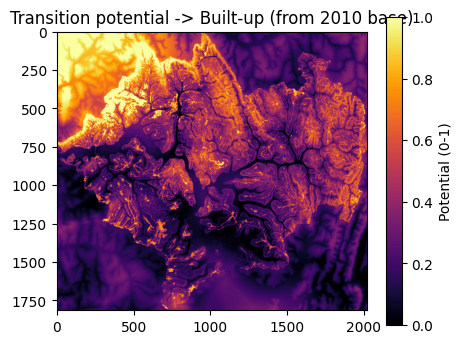

In [10]:
SUITABILITY_WEIGHTS = {
    1: {'dist_roads': +0.05, 'dist_trade': +0.05, 'slope': -0.35, 'dem': -0.25, 'dist_parks': -0.15},  # Cropland
    2: {'dist_parks': +0.8, 'dist_roads': -0.7, 'slope': +0.15, 'dem': +0.25, 'dist_trade': -0.3},     # Forest
    3: {'dist_roads': -0.45, 'slope': +0.25, 'dem': +0.25, 'dist_parks': +0.15, 'dist_trade': -0.25},  # Shrubland
    4: {'dist_roads': -0.1, 'slope': -0.2, 'dist_lakes': -0.2},                                        # Grassland
    5: {'slope': +0.4, 'dem': +0.3},                                                                    # Sparse vegetation
    6: {'dist_lakes': +0.9, 'slope': -0.3, 'dem': -0.4},                                                # Wetland
    7: {'dist_roads': +0.6, 'dist_trade': +0.6, 'slope': -0.6, 'dem': -0.6},                            # Built-up
    8: {'slope': +0.3, 'dem': +0.2},                                                                     # Bareland
    9: {'dist_lakes': +0.7},                                                                             # Water
}

def suitability_for_class(cls):
    weights = SUITABILITY_WEIGHTS.get(cls, {})
    score = np.zeros_like(next(iter(drivers_norm.values())))
    for name, w in weights.items():
        d = drivers_norm[name]
        score += w * (d if w > 0 else (1 - d))
    return norm01(score)

def neighborhood_effect(current_map, cls, window=5):
    kernel = np.ones((window, window))
    kernel[window // 2, window // 2] = 0
    match = (current_map == cls).astype(float)
    density = convolve(match, kernel, mode='nearest') / kernel.sum()
    return density

def potential_map(current_map, cls):
    suit = suitability_for_class(cls)
    neigh = neighborhood_effect(current_map, cls)
    return norm01(0.6 * suit + 0.4 * neigh)

# preview one class's potential surface
plt.figure(figsize=(5, 4))
plt.imshow(potential_map(lulc2010_arr, 7), cmap='inferno')
plt.title('Transition potential -> Built-up (from 2010 base)')
plt.colorbar(label='Potential (0-1)')
plt.show()

## 7. Cellular Automata Allocation (CA-Markov Model)

Allocates, per (from-class, to-class) pair, the number of pixels predicted by the TPM, prioritizing the
highest-potential candidate cells (potential = suitability x neighborhood density). Fixed to guard
against zero/negative allocation counts, which could otherwise raise an `argpartition` error.

In [11]:
def ca_markov_step(current_map, tpm, class_ids):
    n = len(class_ids)
    idx = {c: i for i, c in enumerate(class_ids)}
    class_counts = {c: int((current_map == c).sum()) for c in class_ids}

    # expected pixel change per (from, to) pair
    change_pairs = []
    for i, ci in enumerate(class_ids):
        for j, cj in enumerate(class_ids):
            if ci == cj:
                continue
            n_change = int(round(tpm[i, j] * class_counts[ci]))
            if n_change > 0:
                change_pairs.append((n_change, ci, cj))
    change_pairs.sort(reverse=True)  # largest transitions allocated first

    predicted = current_map.copy()
    already_moved = np.zeros_like(current_map, dtype=bool)

    # cache potential maps per target class (recomputed once per step)
    potentials = {c: potential_map(current_map, c) for c in class_ids}

    for n_change, ci, cj in change_pairs:
        candidates_mask = (current_map == ci) & (~already_moved)
        n_available = int(candidates_mask.sum())
        if n_available == 0:
            continue
        n_change = min(n_change, n_available)
        if n_change <= 0:
            continue

        scores = np.where(candidates_mask, potentials[cj], -1)
        flat_idx = np.argpartition(scores.ravel(), -n_change)[-n_change:]
        rows, cols = np.unravel_index(flat_idx, scores.shape)
        predicted[rows, cols] = cj
        already_moved[rows, cols] = True

    return predicted

simulated_2020 = ca_markov_step(lulc2010_arr, TPM_2000_2010, CLASS_IDS)
print('Simulated 2020 LULC generated.')

Simulated 2020 LULC generated.


## 8. Model Validation: Simulated 2020 vs Actual 2020

**ACTION REQUIRED** - Kappa threshold (commonly >= 0.70-0.80 is treated as "satisfactory"). Adjust
`KAPPA_THRESHOLD` as needed.

In [12]:
KAPPA_THRESHOLD = 0.60

mask_valid = np.isin(lulc2020_arr, CLASS_IDS) & np.isin(simulated_2020, CLASS_IDS)
y_true = lulc2020_arr[mask_valid].astype(int).ravel()
y_pred = simulated_2020[mask_valid].astype(int).ravel()

overall_acc = accuracy_score(y_true, y_pred)
kappa = cohen_kappa_score(y_true, y_pred)
cm = confusion_matrix(y_true, y_pred, labels=CLASS_IDS)
cm_df = pd.DataFrame(cm, index=[CLASS_NAMES[c] for c in CLASS_IDS],
                      columns=[CLASS_NAMES[c] for c in CLASS_IDS])

print(f'Overall Accuracy: {overall_acc:.3f}')
print(f'Kappa (KIA): {kappa:.3f}')
print('Model', 'SATISFACTORY - proceed to calibrated forecast' if kappa >= KAPPA_THRESHOLD
      else 'NOT satisfactory - revisit suitability weights / class scheme before forecasting')
cm_df

Overall Accuracy: 0.772
Kappa (KIA): 0.645
Model SATISFACTORY - proceed to calibrated forecast


,Cropland,Forest,Shrubland,Grassland,Sparse vegetation,Wetland,Built-up,Bareland,Water
Cropland,981473,41152,30562,3479,216,14614,57971,257,312
Forest,67218,225612,9829,553,123,11486,7704,225,294
Shrubland,58930,25524,97408,3101,24,3557,11800,113,104
Grassland,13006,1519,3438,1948,8,1237,2936,72,49
Sparse vegetation,356,74,11,0,2,263,6,3,19
Wetland,16006,7641,401,108,107,96561,20,126,7475
Built-up,47637,2619,2049,391,0,1931,104985,208,13
Bareland,3173,968,214,87,9,2485,412,967,370
Water,1140,1392,25,2,35,3364,14,158,87225


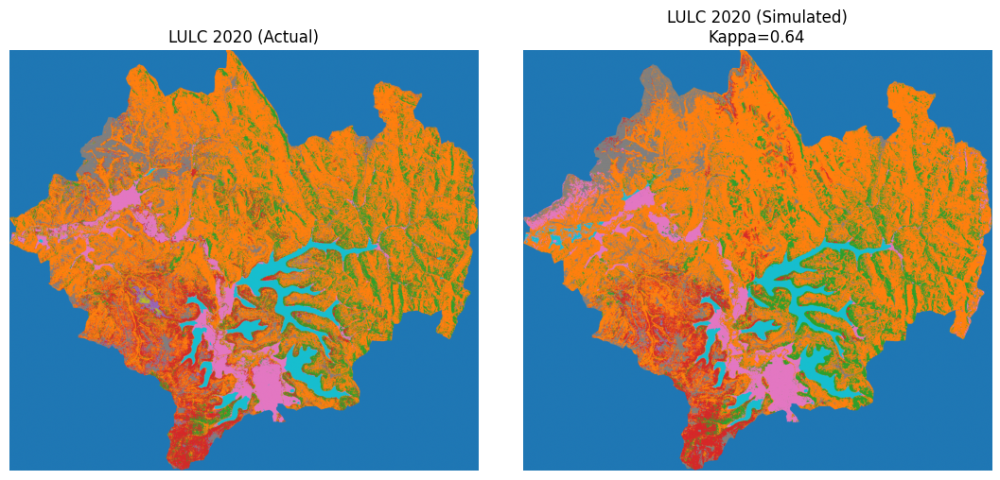

In [13]:
fig, axes = plt.subplots(1, 2, figsize=(11, 5))
axes[0].imshow(lulc2020_arr, cmap='tab10', vmin=0, vmax=9)
axes[0].set_title('LULC 2020 (Actual)')
axes[1].imshow(simulated_2020, cmap='tab10', vmin=0, vmax=9)
axes[1].set_title(f'LULC 2020 (Simulated)\nKappa={kappa:.2f}')
for ax in axes:
    ax.axis('off')
plt.tight_layout()
plt.show()

## 9. Calibrated CA-Markov Model: Forecast 2030 -> 2100 (decadal steps)

Uses the **2010 -> 2020 (actual)** transition as the calibrated TPM and rolls the model forward one
decade at a time from 2020 through 2100. All decadal steps are kept (needed for the chain to be valid),
but only `REPORT_YEARS` (2030, 2040, 2050, 2080, 2090, 2100) are treated as the headline outputs in the
rest of the notebook.

Predicted LULC 2030 generated (reported).
Predicted LULC 2040 generated (reported).
Predicted LULC 2050 generated (reported).
Predicted LULC 2060 generated (intermediate step).
Predicted LULC 2070 generated (intermediate step).
Predicted LULC 2080 generated (reported).
Predicted LULC 2090 generated (reported).
Predicted LULC 2100 generated (reported).


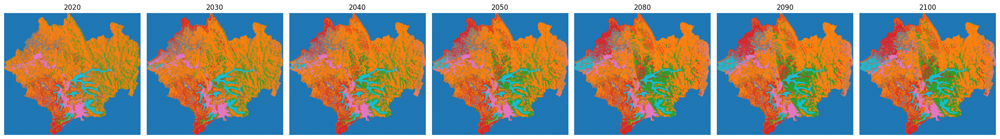

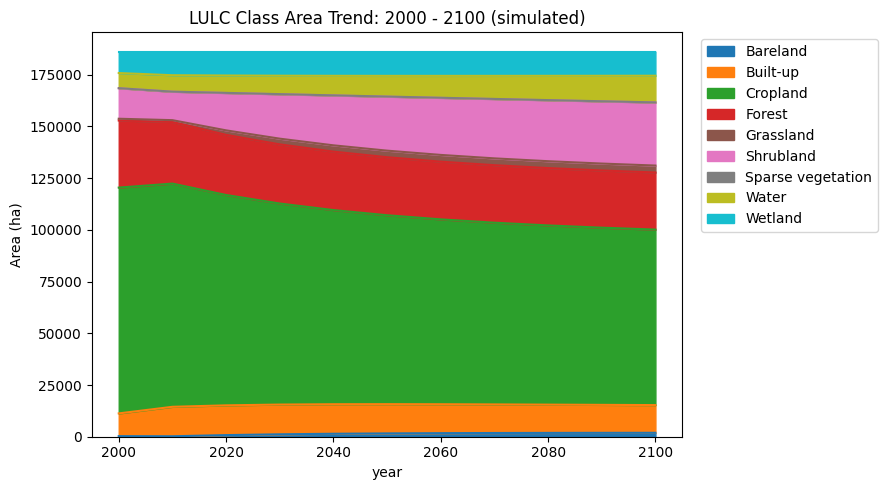

class,Bareland,Built-up,Cropland,Forest,Grassland,Shrubland,Sparse vegetation,Water,Wetland
year,,,,,,,,,
2000,281.7,10988.4,109168.2,32464.5,836.8,14727.1,56.4,7314.4,10364.0
2010,220.0,14242.3,107923.1,29795.0,870.8,13738.5,47.2,7940.1,11424.4
2020,781.6,14385.0,101703.2,29074.0,2179.2,18050.5,66.1,8401.9,11560.0
2030,1170.6,14373.7,97205.9,28588.7,2765.0,21468.8,66.3,8911.4,11651.0
2040,1433.8,14276.9,93866.4,28263.7,3042.6,24097.4,65.8,9451.8,11703.2
2050,1608.5,14136.9,91336.8,28046.3,3183.0,26084.6,65.7,10012.0,11727.7
2060,1723.6,13979.9,89387.6,27899.6,3258.8,27570.1,65.3,10583.2,11733.5
2070,1798.6,13820.8,87861.3,27797.6,3301.5,28670.0,65.1,11160.4,11726.3
2080,1846.2,13668.7,86646.3,27723.1,3326.0,29476.2,65.0,11739.8,11710.4


In [14]:
TPM_2010_2020, _ = transition_matrix(lulc2010_arr, lulc2020_arr, CLASS_IDS)

predictions = {2020: lulc2020_arr}  # actual, used as the forecast starting point
current = lulc2020_arr.copy()
for year in ALL_STEP_YEARS:
    current = ca_markov_step(current, TPM_2010_2020, CLASS_IDS)
    predictions[year] = current
    tag = '(reported)' if year in REPORT_YEARS else '(intermediate step)'
    print(f'Predicted LULC {year} generated {tag}.')

years_to_plot = [2020] + REPORT_YEARS
fig, axes = plt.subplots(1, len(years_to_plot), figsize=(3.5 * len(years_to_plot), 4))
for ax, yr in zip(axes, years_to_plot):
    ax.imshow(predictions[yr], cmap='tab10', vmin=0, vmax=9)
    ax.set_title(str(yr))
    ax.axis('off')
plt.tight_layout()
plt.show()

# Class-area trend table (hectares), assuming SCALE x SCALE m pixels
px_area_ha = (SCALE * SCALE) / 10000
area_records = []
all_years_arrays = {2000: lulc2000_arr, 2010: lulc2010_arr, **predictions}
for yr, arr in sorted(all_years_arrays.items()):
    for c in CLASS_IDS:
        area_records.append({'year': yr, 'class': CLASS_NAMES[c],
                              'area_ha': (arr == c).sum() * px_area_ha})
area_df = pd.DataFrame(area_records)
area_pivot = area_df.pivot(index='year', columns='class', values='area_ha')
area_pivot.plot(kind='area', stacked=True, figsize=(9, 5), colormap='tab10')
plt.ylabel('Area (ha)')
plt.title('LULC Class Area Trend: 2000 - 2100 (simulated)')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.tight_layout()
plt.show()
area_pivot.round(1)

## 10. Full Map Panel (2000 -> 2100)

**Updated:** the "no data" / outside-AOI background is now rendered **white** instead of gray, and each
subplot has a **visible lat/lon grid** (sparse ticks so it stays readable).

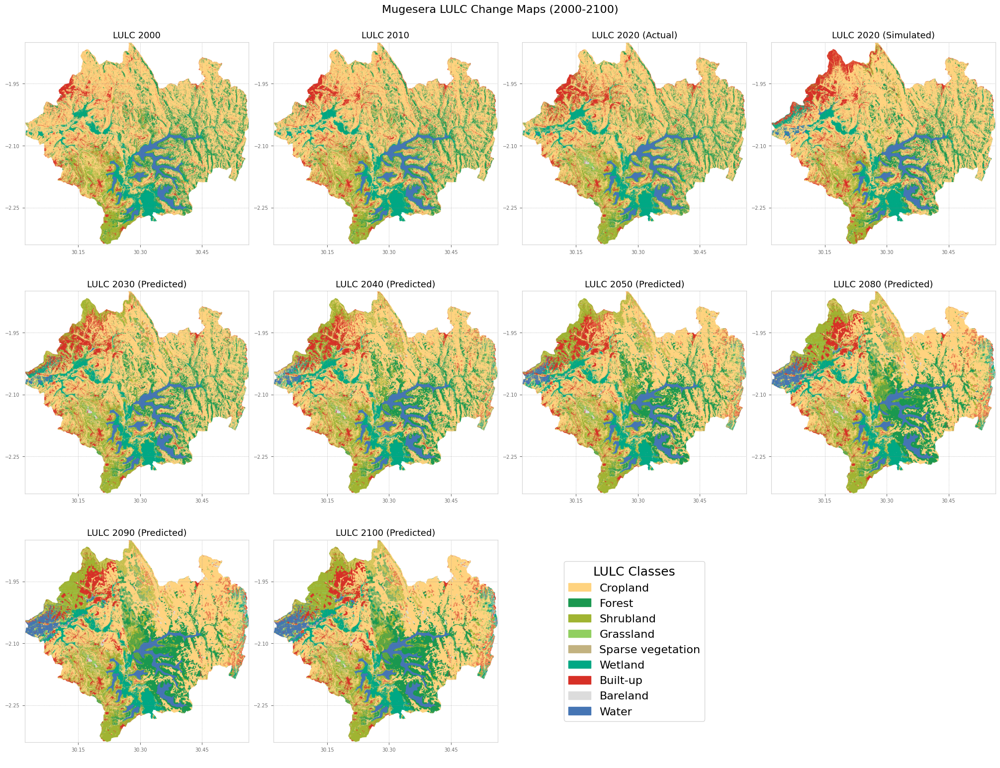

In [15]:
bounds = region.getInfo()['coordinates'][0]
lon_min = min(p[0] for p in bounds)
lon_max = max(p[0] for p in bounds)
lat_min = min(p[1] for p in bounds)
lat_max = max(p[1] for p in bounds)
extent_coords = [lon_min, lon_max, lat_min, lat_max]

# Recolor class 0 ("No data" / outside-AOI) from gray to white, and tell the
# colormap to render any NaNs as white too (in case masked EE pixels come
# through as NaN rather than 0 on some assets).
palette_white_bg = palette.copy()
palette_white_bg[0] = '#ffffff'
cmap_lulc = matplotlib.colors.ListedColormap(palette_white_bg)
cmap_lulc.set_bad(color='white')

map_data_to_plot = {
    'LULC 2000': lulc2000_arr,
    'LULC 2010': lulc2010_arr,
    'LULC 2020 (Actual)': lulc2020_arr,
    'LULC 2020 (Simulated)': simulated_2020,
}
for yr in REPORT_YEARS:
    map_data_to_plot[f'LULC {yr} (Predicted)'] = predictions[yr]

n_maps = len(map_data_to_plot)
n_cols = 4
rows = (n_maps + n_cols - 1) // n_cols
fig, axes = plt.subplots(nrows=rows, ncols=n_cols, figsize=(20, 5 * rows), constrained_layout=True)
fig.patch.set_facecolor('white')
axes = np.atleast_1d(axes).flatten()

i = -1
for i, (title, arr) in enumerate(map_data_to_plot.items()):
    ax = axes[i]
    ax.imshow(arr, cmap=cmap_lulc, vmin=0, vmax=9, extent=extent_coords, alpha=1.0)
    ax.set_title(title, fontsize=13)
    ax.set_facecolor('white')

    ax.xaxis.set_major_locator(MaxNLocator(4))
    ax.yaxis.set_major_locator(MaxNLocator(4))
    ax.tick_params(axis='both', labelsize=7, colors='dimgray')
    ax.grid(True, linestyle=':', linewidth=0.6, alpha=0.7, color='gray')
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_color('lightgray')

legend_ax = None
for j in range(i + 1, len(axes)):
    if legend_ax is None:
        legend_ax = axes[j]
        legend_ax.axis('off')
        legend_handles = [mpatches.Patch(color=palette[c], label=CLASS_NAMES[c]) for c in CLASS_IDS]
        legend_ax.legend(handles=legend_handles, title='LULC Classes', loc='center',
                          fontsize=16, title_fontsize=18, frameon=True)
    else:
        fig.delaxes(axes[j])

plt.suptitle('Mugesera LULC Change Maps (2000-2100)', fontsize=16, y=1.02)
plt.show()

## 10b. Predictor / Driver Variable Maps

Static panel version of the driver layers added to the interactive `Map` in Section 3 - distance to
roads, distance to lakes, distance to parks, slope, and DEM - using the numpy arrays pulled in
Section 4. Same white-background + grid treatment as the LULC panel above, plus a colorbar per
variable.

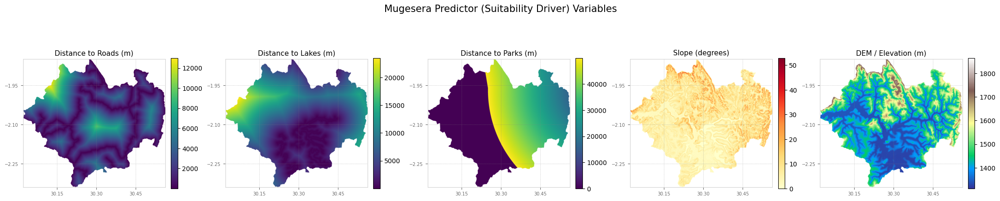

In [16]:
# Areas outside the AOI (no LULC value) are masked to NaN -> rendered white,
# same convention as the LULC panel above.
nodata_mask = (lulc2020_arr == 0)

predictor_data_to_plot = {
    'Distance to Roads (m)':  (dist_roads_arr, 'viridis'),
    'Distance to Lakes (m)':  (dist_lakes_arr, 'viridis'),
    'Distance to Parks (m)':  (dist_parks_arr, 'viridis'),
    'Slope (degrees)':        (slope_arr,      'YlOrRd'),
    'DEM / Elevation (m)':    (dem_arr,        'terrain'),
}

n_pred = len(predictor_data_to_plot)
fig, axes = plt.subplots(1, n_pred, figsize=(4.3 * n_pred, 4.6), constrained_layout=True)
fig.patch.set_facecolor('white')
axes = np.atleast_1d(axes)

for ax, (title, (arr, cmap_name)) in zip(axes, predictor_data_to_plot.items()):
    plot_arr = np.where(nodata_mask, np.nan, arr)
    cmap = plt.get_cmap(cmap_name).copy()
    cmap.set_bad(color='white')

    im = ax.imshow(plot_arr, cmap=cmap, extent=extent_coords)
    ax.set_title(title, fontsize=11)
    ax.set_facecolor('white')

    ax.xaxis.set_major_locator(MaxNLocator(4))
    ax.yaxis.set_major_locator(MaxNLocator(4))
    ax.tick_params(axis='both', labelsize=7, colors='dimgray')
    ax.grid(True, linestyle=':', linewidth=0.6, alpha=0.6, color='gray')
    for spine in ax.spines.values():
        spine.set_color('lightgray')

    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

plt.suptitle('Mugesera Predictor (Suitability Driver) Variables', fontsize=15, y=1.06)
plt.show()

## 11. Dynamic Curve Number (CN) from LULC Change

SCS-CN values depend on **both** land cover AND Hydrologic Soil Group (HSG, A-D).

`Soil_August` classifies soils by **texture** (`TEX` field: Clay, Clay loam, Loam, Sandy clay, Sandy
clay loam, Sandy loam, Silt loam, Silty clay), not by USDA reference-group taxonomy, so HSG is derived
directly from texture using the standard NRCS texture -> HSG grouping (USDA-NRCS *National Engineering
Handbook*, Part 630, Ch. 7) rather than a taxonomy lookup.

**ACTION REQUIRED**: confirm the non-soil `TAXONOMY` labels to exclude and the texture -> HSG assignment
below against local knowledge before treating results as final - in particular, *Clay loam* sits on the
NRCS C/D boundary in some regional guidance; it is set to D here.

In [17]:
soil_fc = ee.FeatureCollection('projects/ee-ngwijabagabohyacinthe/assets/Soil_August')

print('Properties of a sample feature from soil_fc:')
print(soil_fc.first().propertyNames().getInfo())
print('\nSample feature properties (first feature):')
print(soil_fc.first().getInfo()['properties'])

# ACTION REQUIRED: non-soil TAXONOMY labels to exclude - verified against the Soil_August asset.
# Re-run the print above and add/remove labels if your export differs.
NON_SOIL_TAXONOMIES = [
    'Water',
    'Zone urbaine',
    'Zone mini\u00e8re',                 # Zone miniere
    'Affleurement de roches gra',    # Affleurement de roches granitiques (truncated field value)
    'Affleurement de roches qua',    # Affleurement de roches quartzitiques (truncated field value)
]

soil_fc_filtered = soil_fc.filterBounds(aoi_geom)
for label in NON_SOIL_TAXONOMIES:
    soil_fc_filtered = soil_fc_filtered.filter(ee.Filter.neq('TAXONOMY', label))

all_taxonomies = soil_fc_filtered.aggregate_array('TAXONOMY').distinct().sort().getInfo()
all_textures = soil_fc_filtered.aggregate_array('TEX').distinct().sort().getInfo()
print('Remaining TAXONOMY values in AOI:', all_taxonomies)
print('Unique TEX values in AOI:', all_textures)
print('Soil texture polygon counts:', soil_fc_filtered.aggregate_histogram('TEX').getInfo())
print('Number of soil polygons in AOI:', soil_fc_filtered.size().getInfo())

# ACTION REQUIRED: texture -> HSG (1=A, 2=B, 3=C, 4=D), per NRCS NEH Part 630 Ch.7 conventions:
#   A: sand, loamy sand, sandy loam
#   B: loam, silt loam
#   C: sandy clay loam
#   D: clay loam, silty clay loam, sandy clay, silty clay, clay
TEXTURE_TO_HSG = {
    'clay': 4,               # D
    'clay loam': 4,          # D (regionally reported as C/D boundary - review)
    'loam': 2,                # B
    'sandy clay': 4,          # D
    'sandy clay loam': 3,      # C
    'sandy loam': 1,           # A
    'silt loam': 2,            # B
    'silty clay': 4,           # D
    '': 2,                     # default to B when texture is blank/unclassified
}

ee_texture_to_hsg = ee.Dictionary(TEXTURE_TO_HSG)

def map_texture_to_hsg(feature):
    texture = ee.String(
        ee.Algorithms.If(feature.get('TEX'), feature.get('TEX'), '')
    ).toLowerCase()
    hsg_val = ee_texture_to_hsg.get(texture, ee.Number(2))  # default B if texture not in table
    return feature.set('HSG', ee.Number(hsg_val))

soil_hsg_fc = soil_fc_filtered.map(map_texture_to_hsg)

hsg_image = soil_hsg_fc.reduceToImage(
    properties=['HSG'],
    reducer=ee.Reducer.first()
).rename('HSG').clip(aoi_geom)

hsg_vis = {'min': 1, 'max': 4, 'palette': ['#2c7fb8', '#7fcdbb', '#fed976', '#d7301f']}  # A(blue)->D(red)
Map.addLayer(hsg_image, hsg_vis, 'Hydrologic Soil Group (A-D)')

hsg_arr = to_array(hsg_image, 'HSG')

print('HSG grid shape:', hsg_arr.shape)
print('Unique HSG values and counts:', np.unique(hsg_arr[~np.isnan(hsg_arr)], return_counts=True))

# ACTION REQUIRED: CN lookup table by LULC class (rows) x HSG (columns A-D) - review against
# literature (e.g. NRCS TR-55) or local calibration.
CN_TABLE_BY_HSG = {
    1: {1: 62, 2: 71, 3: 78, 4: 81},   # Cropland (row crops, contoured)
    2: {1: 30, 2: 55, 3: 70, 4: 77},   # Forest (good condition)
    3: {1: 48, 2: 67, 3: 78, 4: 83},   # Shrubland / brush
    4: {1: 39, 2: 61, 3: 74, 4: 80},   # Grassland / pasture (fair condition)
    5: {1: 72, 2: 80, 3: 86, 4: 89},   # Sparse vegetation (barren, <50% cover)
    6: {1: 60, 2: 73, 3: 82, 4: 87},   # Wetland (marsh, non-forest)
    7: {1: 76, 2: 83, 3: 89, 4: 92},   # Built-up (impervious, residential)
    8: {1: 77, 2: 86, 3: 91, 4: 94},   # Bareland (unvegetated, compacted)
    9: {1: 100, 2: 100, 3: 100, 4: 100},  # Water
}

def cn_map(lulc_arr, hsg_arr, table=CN_TABLE_BY_HSG):
    cn = np.full(lulc_arr.shape, np.nan)
    for cls, hsg_values in table.items():
        for hsg_type, cn_val in hsg_values.items():
            cn[(lulc_arr == cls) & (hsg_arr == hsg_type)] = cn_val
    return cn

cn_maps = {
    2000: cn_map(lulc2000_arr, hsg_arr),
    2010: cn_map(lulc2010_arr, hsg_arr),
    '2020_actual': cn_map(lulc2020_arr, hsg_arr),
    '2020_simulated': cn_map(simulated_2020, hsg_arr),
}
for yr in ALL_STEP_YEARS:
    cn_maps[yr] = cn_map(predictions[yr], hsg_arr)

cn_summary = pd.DataFrame({
    'year': list(cn_maps.keys()),
    'mean_CN': [np.nanmean(v) for v in cn_maps.values()],
    'max_CN': [np.nanmax(v) for v in cn_maps.values()],
})
cn_summary

Properties of a sample feature from soil_fc:
['Matériau_', 'Nom_série', 'TEX', 'MATPARI', 'soils_dom', 'Depth', 'OID_', 'TAXONOMY', 'PROF__Nø', 'AREA', 'Degré_év', 'C____', 'SAND', 'SERIEDOM', 'Série', 'NUMLABEL', 'SERIE', 'Prof__N_', 'PM_Correct', 'SILT', 'HOR_DEPTH', 'BULK_DENSI', 'PM', 'CLAY', 'system:index']

Sample feature properties (first feature):
{'AREA': 27764.238, 'BULK_DENSI': 0, 'CLAY': 0, 'C____': 0, 'Degré_év': '', 'Depth': 0, 'HOR_DEPTH': 0, 'MATPARI': '', 'Matériau_': '', 'NUMLABEL': 6001, 'Nom_série': '', 'OID_': 0, 'PM': 'Water', 'PM_Correct': '', 'PROF__Nø': '', 'Prof__N_': '', 'SAND': 0, 'SERIE': 'LACS', 'SERIEDOM': 'LAC', 'SILT': 0, 'Série': '', 'TAXONOMY': 'Water', 'TEX': '', 'soils_dom': 'Water'}
Remaining TAXONOMY values in AOI: ['Aeric Tropaquept', 'Aeric Umbric Tropaquult', 'Aquic Dystropept', 'Aquic Tropudalf', 'Cumulic Haplaquoll', 'Fluvaquentic Tropohemist', 'Fluventic Humitropept', 'Haplohumic Eutrorthox', 'Haplohumox', 'Humoxic Sombrihumult', 'Humoxic Tr

,year,mean_CN,max_CN
0,2000,76.185467,100.0
1,2010,76.613815,100.0
2,2020_actual,76.690139,100.0
3,2020_simulated,77.031090,100.0
4,2030,76.747458,100.0
5,2040,76.853450,100.0
6,2050,76.912198,100.0
7,2060,76.990455,100.0
8,2070,77.047559,100.0
9,2080,77.118808,100.0


## 12. Curve Number Per Sub-Basin

Zonal statistics computed locally from the co-registered `subbasin_arr` and each year's CN map (mean
CN, area-weighted runoff-potential class, and area in hectares per sub-basin per year), for the
2000/2010 base years, the 2020 actual + simulated validation maps, and every forecast year.

In [18]:
def zonal_cn_stats(cn_arr, subbasin_arr, year_label, px_area_ha):
    records = []
    valid_ids = np.unique(subbasin_arr[~np.isnan(subbasin_arr)]).astype(int)
    for sid in valid_ids:
        if sid <= 0:
            continue
        mask = (subbasin_arr == sid) & (~np.isnan(cn_arr))
        n_px = int(mask.sum())
        if n_px == 0:
            continue
        records.append({
            'year': year_label,
            'subbasin_id': sid,
            'subbasin_name': sb_names.get(sid, ''),
            'mean_CN': float(np.nanmean(cn_arr[mask])),
            'min_CN': float(np.nanmin(cn_arr[mask])),
            'max_CN': float(np.nanmax(cn_arr[mask])),
            'area_ha': n_px * px_area_ha,
        })
    return records

subbasin_cn_records = []
for year_label, cn_arr in cn_maps.items():
    subbasin_cn_records.extend(zonal_cn_stats(cn_arr, subbasin_arr, year_label, px_area_ha))

if not subbasin_cn_records:
    raise RuntimeError(
        "No per-sub-basin CN records were produced - subbasin_arr likely has no valid IDs. "
        "Re-check Section 4a (SUBBASIN_ID_FIELD / the printed unique sub-basin IDs) before continuing."
    )

subbasin_cn_df = pd.DataFrame(subbasin_cn_records)
subbasin_cn_df = subbasin_cn_df.sort_values(['subbasin_id', 'year']).reset_index(drop=True)

subbasin_cn_csv = f'{OUT_DIR}/CN_by_subbasin.csv'
subbasin_cn_df.to_csv(subbasin_cn_csv, index=False)
print('Saved', subbasin_cn_csv)

# Wide pivot: rows = sub-basin, columns = year, values = mean CN (handy for reporting/plots)
subbasin_cn_pivot = subbasin_cn_df.pivot(index='subbasin_id', columns='year', values='mean_CN')
subbasin_cn_pivot

Saved /content/lulc_outputs/CN_by_subbasin.csv


year,2000,2010,2030,2040,2050,2060,2070,2080,2090,2100,2020_actual,2020_simulated
subbasin_id,,,,,,,,,,,,
1,76.510311,76.868036,77.462348,77.748256,77.939392,78.150733,78.291779,78.447349,78.574312,78.692109,77.063035,78.002724
2,76.012674,76.418607,76.184975,76.221630,76.258280,76.291644,76.311286,76.349825,76.390191,76.454508,76.429542,76.275608
3,75.781060,76.425407,76.331795,76.164110,75.954578,75.824623,75.769068,75.714866,75.673543,75.645082,76.380711,76.474476


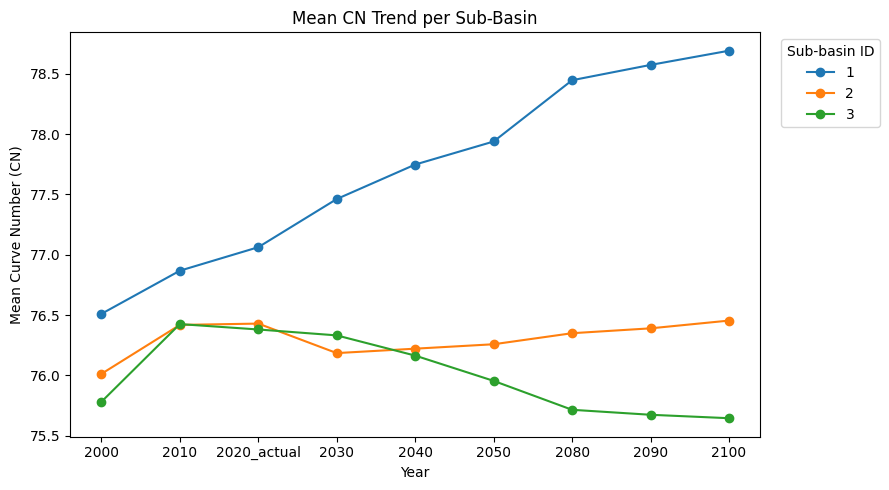

In [19]:
# Mean-CN trend per sub-basin across the reported years
report_labels = [2000, 2010, '2020_actual'] + REPORT_YEARS
plot_pivot = subbasin_cn_pivot[[c for c in report_labels if c in subbasin_cn_pivot.columns]]
plot_pivot.T.plot(figsize=(9, 5), marker='o')
plt.ylabel('Mean Curve Number (CN)')
plt.xlabel('Year')
plt.title('Mean CN Trend per Sub-Basin')
plt.legend(title='Sub-basin ID', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.tight_layout()
plt.show()

## 12b. Spatial CN Maps per Sub-basin (labeled)

Choropleth-style maps: every pixel takes its sub-basin's **mean CN** for that year (from
`subbasin_cn_pivot`), so each sub-basin renders as a flat color block, with its numeric `SB_ID` labeled
at the sub-basin's centroid. Same white background + grid convention as the other panels.

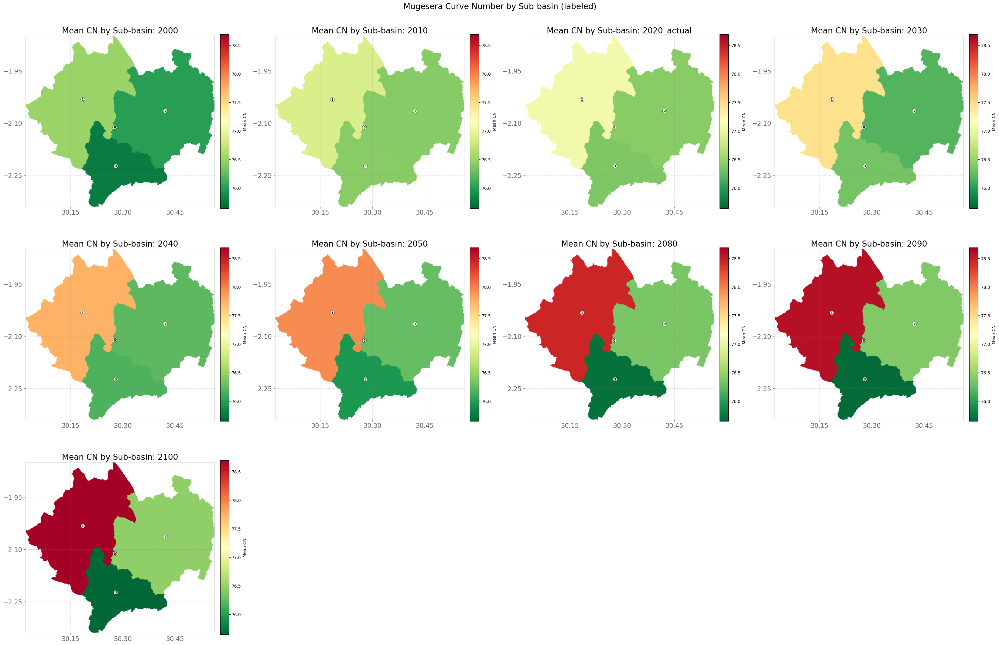

,subbasin_id,subbasin_name
0,0,
1,1,Subbasin-1
2,2,Subbasin-2
3,3,Subbasin-3


In [42]:
# Pixel-coordinate centroids (in the plotting lon/lat extent) for label placement
h, w = subbasin_arr.shape

def rowcol_to_lonlat(row, col):
    lon = lon_min + (col + 0.5) / w * (lon_max - lon_min)
    lat = lat_max - (row + 0.5) / h * (lat_max - lat_min)
    return lon, lat

subbasin_centroids = {}
for sid in valid_sb_ids:
    rows_px, cols_px = np.where(subbasin_arr == sid)
    if rows_px.size == 0:
        continue
    subbasin_centroids[sid] = rowcol_to_lonlat(rows_px.mean(), cols_px.mean())

def cn_choropleth(cn_year_label):
    """Array where every sub-basin's pixels = that sub-basin's mean CN for the given year label."""
    if cn_year_label not in subbasin_cn_pivot.columns:
        raise KeyError(
            f"{cn_year_label!r} not in subbasin_cn_pivot columns: {list(subbasin_cn_pivot.columns)}"
        )
    means = subbasin_cn_pivot[cn_year_label]
    out = np.full(subbasin_arr.shape, np.nan)
    for sid, val in means.items():
        if pd.isna(val):
            continue
        out[subbasin_arr == sid] = val
    return out

years_for_cn_maps = [2000, 2010, '2020_actual'] + REPORT_YEARS
years_for_cn_maps = [y for y in years_for_cn_maps if y in subbasin_cn_pivot.columns]

n_cn = len(years_for_cn_maps)
n_cols_cn = 4
rows_cn = (n_cn + n_cols_cn - 1) // n_cols_cn

fig, axes = plt.subplots(rows_cn, n_cols_cn, figsize=(8.2 * n_cols_cn, 7 * rows_cn),
                          constrained_layout=True)
fig.patch.set_facecolor('white')
axes = np.atleast_1d(axes).flatten()

cn_cmap = plt.get_cmap('RdYlGn_r').copy()
cn_cmap.set_bad(color='white')

vmin_cn = float(subbasin_cn_pivot[years_for_cn_maps].min().min())
vmax_cn = float(subbasin_cn_pivot[years_for_cn_maps].max().max())

i = -1
for i, yr_label in enumerate(years_for_cn_maps):
    ax = axes[i]
    choropleth = cn_choropleth(yr_label)
    im = ax.imshow(choropleth, cmap=cn_cmap, vmin=vmin_cn, vmax=vmax_cn, extent=extent_coords)
    ax.set_title(f'Mean CN by Sub-basin: {yr_label}', fontsize=19)
    ax.set_facecolor('white')

    ax.xaxis.set_major_locator(MaxNLocator(4))
    ax.yaxis.set_major_locator(MaxNLocator(4))
    ax.tick_params(axis='both', labelsize=15, colors='dimgray')
    ax.grid(True, linestyle=':', linewidth=0.6, alpha=0.6, color='gray')
    for spine in ax.spines.values():
        spine.set_color('lightgray')

    # Sub-basin ID labels at each centroid
    for sid, (lon, lat) in subbasin_centroids.items():
        ax.text(lon, lat, str(sid), fontsize=7, ha='center', va='center',
                color='black', fontweight='bold',
                bbox=dict(boxstyle='circle,pad=0.19', facecolor='white',
                          edgecolor='black', linewidth=0.5, alpha=0.85))

    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.03, label='Mean CN')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle('Mugesera Curve Number by Sub-basin (labeled)', fontsize=19, y=1.02)
plt.show()

# Reference table: sub-basin ID -> name, matching the labels above
sb_label_ref = pd.DataFrame({
    'subbasin_id': list(subbasin_centroids.keys()),
    'subbasin_name': [sb_names.get(sid, '') for sid in subbasin_centroids.keys()],
}).sort_values('subbasin_id').reset_index(drop=True)
sb_label_ref

## 13. Export GeoTIFFs of LULC (all years) + CN maps

Uses the AOI bounds **reprojected into the working CRS** (`CRS`, now `EPSG:32736` - see Section 1b),
so the affine transform lines up with the grid `to_array()` actually sampled.

In [ ]:
aoi_geom_proj = aoi_geom.transform(CRS, 1)
proj_bounds = aoi_geom_proj.bounds(1, CRS).getInfo()['coordinates'][0]
x_min = min(p[0] for p in proj_bounds); x_max = max(p[0] for p in proj_bounds)
y_min = min(p[1] for p in proj_bounds); y_max = max(p[1] for p in proj_bounds)

def save_geotiff(arr, path, dtype='float32'):
    h, w = arr.shape
    transform = from_bounds(x_min, y_min, x_max, y_max, w, h)
    with rasterio.open(path, 'w', driver='GTiff', height=h, width=w, count=1, dtype=dtype,
                        crs=CRS, transform=transform, nodata=np.nan) as dst:
        dst.write(arr.astype(dtype), 1)
    print('Saved', path)

# --- LULC GeoTIFFs (actual, simulated, and every forecast year, per the request) ---
save_geotiff(lulc2000_arr, f'{OUT_DIR}/LULC_2000.tif', 'int16')
save_geotiff(lulc2010_arr, f'{OUT_DIR}/LULC_2010.tif', 'int16')
save_geotiff(lulc2020_arr, f'{OUT_DIR}/LULC_2020_actual.tif', 'int16')
save_geotiff(simulated_2020, f'{OUT_DIR}/LULC_2020_simulated.tif', 'int16')
for yr in ALL_STEP_YEARS:
    tag = '' if yr in REPORT_YEARS else '_intermediate'
    save_geotiff(predictions[yr], f'{OUT_DIR}/LULC_{yr}_predicted{tag}.tif', 'int16')

# --- CN GeoTIFFs (AOI-wide dynamic CN, matching the LULC years above) ---
for yr, arr in cn_maps.items():
    save_geotiff(arr, f'{OUT_DIR}/CN_{yr}.tif', 'float32')

# --- Sub-basin ID raster, for reference / joining the CSV to a GIS ---
save_geotiff(subbasin_arr, f'{OUT_DIR}/Subbasin_ID.tif', 'int16')

# --- Predictor / driver-variable GeoTIFFs ---
save_geotiff(dist_roads_arr, f'{OUT_DIR}/Predictor_dist_roads.tif', 'float32')
save_geotiff(dist_lakes_arr, f'{OUT_DIR}/Predictor_dist_lakes.tif', 'float32')
save_geotiff(dist_parks_arr, f'{OUT_DIR}/Predictor_dist_parks.tif', 'float32')
save_geotiff(slope_arr,      f'{OUT_DIR}/Predictor_slope.tif',      'float32')
save_geotiff(dem_arr,        f'{OUT_DIR}/Predictor_dem.tif',        'float32')

print('\nAll GeoTIFFs written to', OUT_DIR)
print('Sub-basin CN table written to', subbasin_cn_csv)

In [ ]:
#@title (Optional) Copy outputs to Google Drive
# from google.colab import drive
# drive.mount('/content/drive')
# !cp -r {OUT_DIR} '/content/drive/MyDrive/Mugesera_LULC_Outputs'

## 14. (Recommended) True georeferenced export via Earth Engine batch tasks

For publication-quality exports that reuse Earth Engine's native projection machinery instead of the
local NumPy->GeoTIFF round-trip, convert each predicted array back into an `ee.Image` and export with
`ee.batch.Export.image`. This needs a recent `geemap` (`numpy_to_ee`); if it's unavailable, the
GeoTIFFs from Section 13 are already valid deliverables - skip this section.

In [ ]:
def array_to_ee_image(arr, ref_image):
    # Wrap a numpy array back into an ee.Image aligned to ref_image's footprint.
    return geemap.numpy_to_ee(arr, ref_image, region=region, scale=SCALE, crs=CRS)

years_to_export = {
    'LULC_2000': lulc2000_arr,
    'LULC_2010': lulc2010_arr,
    'LULC_2020_actual': lulc2020_arr,
    'LULC_2020_simulated': simulated_2020,
}
for yr in ALL_STEP_YEARS:
    years_to_export[f'LULC_{yr}_predicted'] = predictions[yr]

try:
    for name, arr in years_to_export.items():
        img = array_to_ee_image(arr, lulc_2010).toInt16()

        task_drive = ee.batch.Export.image.toDrive(
            image=img,
            description=f'Mugesera_{name}_GeoTIFF',
            folder='GEE_Exports',
            fileNamePrefix=name,
            region=region,
            scale=SCALE,
            crs=CRS,
            maxPixels=1e13,
            fileFormat='GeoTIFF'
        )
        task_drive.start()

        task_asset = ee.batch.Export.image.toAsset(
            image=img,
            description=f'Mugesera_{name}_Asset',
            assetId=f'projects/{CLOUD_PROJECT}/assets/{name}',
            region=region,
            scale=SCALE,
            crs=CRS,
            maxPixels=1e13
        )
        task_asset.start()

        print(f'Export tasks started for {name} (Drive GeoTIFF + EE Asset).')

    print('Check the "Tasks" tab at https://code.earthengine.google.com/tasks to monitor progress.')
except AttributeError:
    print('geemap.numpy_to_ee is not available in this geemap version - skip this section and use '
          'the local GeoTIFFs written in Section 13 instead.')

### Notes / Caveats

- `geemap.numpy_to_ee` requires a recent `geemap`; if unavailable, rely on the Section 13 GeoTIFFs
  (already correctly georeferenced in the working projected CRS `EPSG:32736`) plus a manual
  `earthengine upload image` CLI call if you also want EE Asset copies.
- The CA allocation in Section 7 is a **simplified, from-scratch reimplementation** of the CA-Markov
  idea (not IDRISI/MOLUSCE's exact algorithm) - good for a defensible academic workflow, but document
  it as such in your methodology write-up.
- Every **ACTION REQUIRED** cell above (class recoding, suitability weights, HSG mapping, CN lookup
  table, Kappa threshold, sub-basin ID field) should be checked against the printed property names/
  values for *your* assets and against literature/local data before treating outputs as final.
- Rolling a decadal Markov chain out to 2100 compounds a lot of uncertainty (80 years past the last
  observed transition); treat 2080-2100 as a scenario extrapolation, not a forecast with the same
  confidence as 2030/2040.
- **Spatial reference (new):** the working analysis CRS was corrected from `EPSG:32735` (UTM 35S) to
  `EPSG:32736` (UTM 36S / WGS84) to match the sub-basin shapefile's native projection (see Section 1b).
  The AOI basin shapefile's original Arc 1960 Transverse Mercator (Rwanda national grid) parameters are
  documented there too, for anyone who needs to work with the original local `.shp` outside Earth
  Engine.

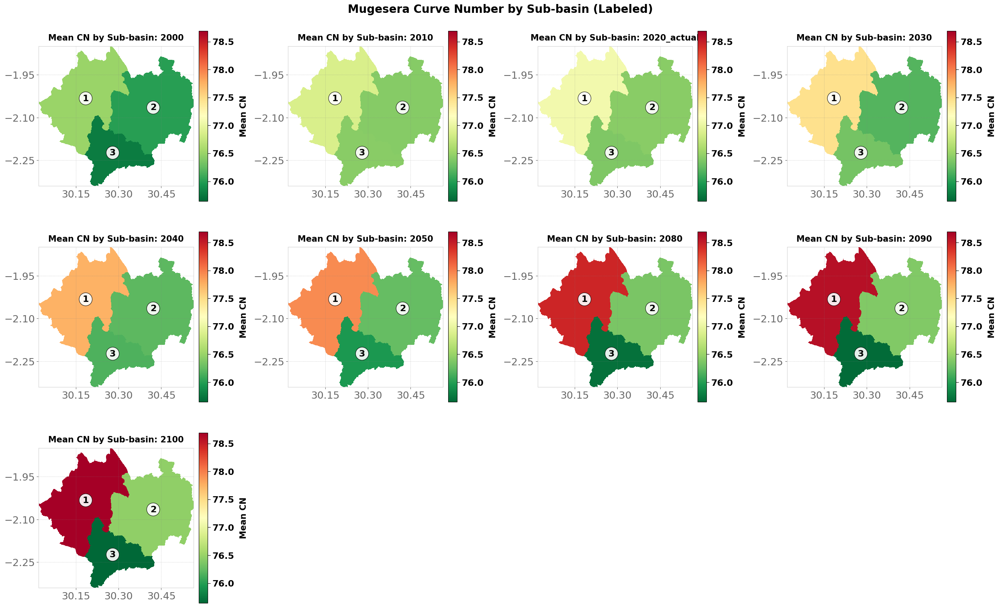

,subbasin_id,subbasin_name
0,1,Subbasin-1
1,2,Subbasin-2
2,3,Subbasin-3


In [50]:
# Pixel-coordinate centroids (in the plotting lon/lat extent) for label placement

h, w = subbasin_arr.shape


def rowcol_to_lonlat(row, col):
    lon = lon_min + (col + 0.5) / w * (lon_max - lon_min)
    lat = lat_max - (row + 0.5) / h * (lat_max - lat_min)
    return lon, lat


# ---------------------------------------------------------
# Calculate sub-basin centroids
# Exclude sub-basin 0
# ---------------------------------------------------------

subbasin_centroids = {}

for sid in valid_sb_ids:

    # Skip background / sub-basin 0
    if sid == 0:
        continue

    rows_px, cols_px = np.where(
        subbasin_arr == sid
    )

    if rows_px.size == 0:
        continue

    subbasin_centroids[sid] = rowcol_to_lonlat(
        rows_px.mean(),
        cols_px.mean()
    )


# ---------------------------------------------------------
# Create CN choropleth
# ---------------------------------------------------------

def cn_choropleth(cn_year_label):

    if cn_year_label not in subbasin_cn_pivot.columns:

        raise KeyError(
            f"{cn_year_label!r} not in "
            f"subbasin_cn_pivot columns: "
            f"{list(subbasin_cn_pivot.columns)}"
        )

    means = subbasin_cn_pivot[cn_year_label]

    out = np.full(
        subbasin_arr.shape,
        np.nan
    )

    for sid, val in means.items():

        # Do not display sub-basin 0
        if sid == 0:
            continue

        if pd.isna(val):
            continue

        out[subbasin_arr == sid] = val

    return out


# ---------------------------------------------------------
# Years to map
# ---------------------------------------------------------

years_for_cn_maps = [
    2000,
    2010,
    '2020_actual'
] + REPORT_YEARS


years_for_cn_maps = [
    y for y in years_for_cn_maps
    if y in subbasin_cn_pivot.columns
]


# ---------------------------------------------------------
# Figure layout
# ---------------------------------------------------------

n_cn = len(years_for_cn_maps)

n_cols_cn = 4

rows_cn = (
    n_cn + n_cols_cn - 1
) // n_cols_cn


fig, axes = plt.subplots(
    rows_cn,
    n_cols_cn,

    figsize=(
        6.2 * n_cols_cn,
        5 * rows_cn
    ),

    constrained_layout=True
)


fig.patch.set_facecolor(
    'white'
)


axes = np.atleast_1d(
    axes
).flatten()


# ---------------------------------------------------------
# CN colour map
# ---------------------------------------------------------

cn_cmap = plt.get_cmap(
    'RdYlGn_r'
).copy()


cn_cmap.set_bad(
    color='white'
)


# ---------------------------------------------------------
# Common CN range
# ---------------------------------------------------------

vmin_cn = float(
    subbasin_cn_pivot[
        years_for_cn_maps
    ].min().min()
)


vmax_cn = float(
    subbasin_cn_pivot[
        years_for_cn_maps
    ].max().max()
)


# ---------------------------------------------------------
# Plot maps
# ---------------------------------------------------------

i = -1


for i, yr_label in enumerate(
    years_for_cn_maps
):

    ax = axes[i]


    # Create CN map
    choropleth = cn_choropleth(
        yr_label
    )


    im = ax.imshow(
        choropleth,

        cmap=cn_cmap,

        vmin=vmin_cn,
        vmax=vmax_cn,

        extent=extent_coords,

        interpolation='nearest'
    )


    # -----------------------------------------------------
    # Map title
    # -----------------------------------------------------

    ax.set_title(
        f'Mean CN by Sub-basin: {yr_label}',

        fontsize=15,

        fontweight='bold',

        pad=10
    )


    ax.set_facecolor(
        'white'
    )


    # -----------------------------------------------------
    # Coordinate ticks
    # -----------------------------------------------------

    ax.xaxis.set_major_locator(
        MaxNLocator(4)
    )

    ax.yaxis.set_major_locator(
        MaxNLocator(4)
    )


    ax.tick_params(
        axis='both',

        labelsize=18,

        colors='dimgray',

        width=0.8
    )


    # -----------------------------------------------------
    # Grid
    # -----------------------------------------------------

    ax.grid(
        True,

        linestyle=':',

        linewidth=0.6,

        alpha=0.6,

        color='gray'
    )


    # -----------------------------------------------------
    # Map border
    # -----------------------------------------------------

    for spine in ax.spines.values():

        spine.set_color(
            'lightgray'
        )

        spine.set_linewidth(
            0.8
        )


    # -----------------------------------------------------
    # Sub-basin ID labels
    # Only 1, 2, 3, ... are displayed
    # -----------------------------------------------------

    for sid, (lon, lat) in subbasin_centroids.items():

        # Safety check: never label 0
        if sid == 0:
            continue

        ax.text(

            lon,
            lat,

            str(sid),

            fontsize=16,

            ha='center',
            va='center',

            color='black',

            fontweight='bold',

            bbox=dict(

                boxstyle='circle,pad=0.28',

                facecolor='white',

                edgecolor='black',

                linewidth=0.8,

                alpha=0.90
            ),

            zorder=10
        )


    # -----------------------------------------------------
    # Colourbar
    # -----------------------------------------------------

    cbar = plt.colorbar(

        im,

        ax=ax,

        fraction=0.055,

        pad=0.035
    )


    cbar.set_label(

        'Mean CN',

        fontsize=15,

        fontweight='bold',

        labelpad=10
    )


    cbar.ax.tick_params(

        labelsize=16,

        width=0.8,

        length=5
    )


    # Bold colourbar values
    for tick in cbar.ax.get_yticklabels():

        tick.set_fontweight(
            'bold'
        )


    cbar.outline.set_linewidth(
        0.8
    )


# ---------------------------------------------------------
# Remove unused axes
# ---------------------------------------------------------

for j in range(
    i + 1,
    len(axes)
):

    fig.delaxes(
        axes[j]
    )


# ---------------------------------------------------------
# Overall figure title
# ---------------------------------------------------------

plt.suptitle(

    'Mugesera Curve Number by Sub-basin (Labeled)',

    fontsize=20,

    fontweight='bold',

    y=1.02
)


# ---------------------------------------------------------
# Save high-resolution figure
# ---------------------------------------------------------

plt.savefig(

    'Mugesera_CN_by_Subbasin.png',

    dpi=600,

    bbox_inches='tight',

    facecolor='white'
)


# ---------------------------------------------------------
# Display
# ---------------------------------------------------------

plt.show()


# ---------------------------------------------------------
# Reference table
# Sub-basin ID → Sub-basin name
# Exclude sub-basin 0
# ---------------------------------------------------------

sb_label_ref = pd.DataFrame({

    'subbasin_id':
        list(
            subbasin_centroids.keys()
        ),

    'subbasin_name':
        [
            sb_names.get(
                sid,
                ''
            )

            for sid in
            subbasin_centroids.keys()
        ]

}).sort_values(

    'subbasin_id'

).reset_index(

    drop=True
)


# Display reference table
sb_label_ref